In [1]:
from spatial_models import *
from spatial_indicators import *
from spatial_plotting import *

from IPython.display import HTML

# Load Simulation Snapshots

In [2]:
load = True  # set to true to load previous simulation results

if load:
    data = load_data('Results/spatial_simulation.dat')
    snapshots1, snapshots2, snapshots3, snapshots4 = data

# Local Positive Feedback Model

## Background

The local positive feedback model is based on the vegetation model by Shnerb et al. (2003) [[1]](https://doi.org/10.1103/PhysRevLett.90.038101) and Guttal and Jayaprakash (2007) [[2]](https://doi.org/10.1016/j.ecolmodel.2006.10.005):

$\frac{dw_{i,j}}{dt}=R-w_{i,j}-\lambda w_{i,j}B_{i,j}+D(w_{i+1,j}+w_{i-1,j}+w_{i,j+1}+w_{i,j-1}-4w_{i,j})+\sigma_w dW_{i,j}$

$\frac{dB_{i,j}}{dt}=\rho B_{i,j}\left(w_{i,j}-\frac{B_{i,j}}{B_c}\right)-\mu\frac{B_{i,j}}{B_{i,j}+B_0}+D(B_{i+1,j}+B_{i-1,j}+B_{i,j+1}+B_{i,j-1}-4B_{i,j})+\sigma_B dW_{i,j}$

Vegetation biomass $B$ grows logistically based on water availability $w$ and is lost due to grazing.

Biomass and water are exchanged between neighbouring cells. A patch with high biomass  will diffuse biomass to its neighbours, leading to a positive effects on its neighbours  but a negative effect on the site itself. This results in no patches and a relatively homogeneous state.

When rainfall falls below a certain value, the cells undergo a shift to a desert state through synchronised fold bifurcations.

## Parameters

Model parameters are taken from Dakos et al. (2011) [[3]](https://doi.org/10.1086/659945) and Guttal and Jayaprakash (2007) [[2]](https://doi.org/10.1016/j.ecolmodel.2006.10.005). The parameter $B_c=1$ was wrong in Dakos et al.'s paper so I amended it to 10 as from Guttal and Jayaprakash's paper.

In [3]:
# fixed model parameters
D = 0.05  # exchange rate
lambda_ = 0.12  # water consumption rate by vegetation
rho = 1.  # maximum vegetation growth rate
Bc = 10.  # vegetation carrying capacity
mu = 2.  # maximum grazing rate
B0 = 1.  # half-saturation constant of vegetation consumption

# noise levels
sigma_w = 0.01  # standard deviation of white noise on water moisture
sigma_B = 0.25  # standard deviation of white noise on vegetation biomass

# model properties
size = 100  # size of each side of lattice
noise = "additive"  # type of noise

# time step size
dt = 0.1

## Numerical Simulation

Space is discretised into a 2D lattice of coupled cells with periodic boundaries.

We use the Euler-Maruyama method to obtain an approximate numerical solution by discretising time:

$w_{i,j}^{n+1}=w_{i,j}^n+(R-w_{i,j}^n-\lambda w_{i,j}^n B_{i,j}+D(w_{i+1,j}^n+w_{i-1,j}^n+w_{i,j+1}^n+w_{i,j-1}^n-4w_{i,j}^n))\Delta t+\sigma_w\Delta W_{i,j}^n$

$B_{i,j}^{n+1}=B_{i,j}^n+\left(\rho B_{i,j^n}\left(w_{i,j}^n-\frac{B_{i,j}^n}{B_c}\right)-\mu\frac{B_{i,j}^n}{B_{i,j}^n+B_0}+D(B_{i+1,j}^n+B_{i-1,j}^n+B_{i,j+1}^n+B_{i,j-1}^n-4B_{i,j}^n)\right)\Delta t+\sigma_B\Delta W_{i,j}^n$

where $W_{i,j}^n\sim N(0,\Delta t)$.

We simulate 10 time steps ($\Delta t=0.1$) at each parameter level over a range of parameter values from $R=2$ to $R=0.8$, decreasing $R$ by 0.01 at each iteration. The final values of the simulation at each parameter level are recorded and used as initial values for the next parameter level. The initial simulation will start from the fully vegetated state and have 100 time steps to allow enough time to settle to the equilibrium.

In [4]:
model1 = LocalPositiveFeedbackModel(D=D, lambda_=lambda_, rho=rho, Bc=Bc, mu=mu, B0=B0, sigma_w=sigma_w, sigma_B=sigma_B, size=size, dt=dt, noise=noise)
R = np.arange(2, 0.8, -0.01)

if not load:
    snapshots1 = parameter_change(model1, R, "R", time_steps=10, warm_up=100)

## Visualisation

In [5]:
HTML(animate_snapshots(snapshots1, vmin=0, vmax=10).to_jshtml())


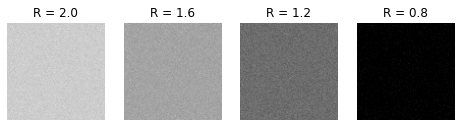

In [6]:
plot_snapshots(snapshots1, [2, 1.6, 1.2, 0.8], "R", vmin=0, vmax=10)

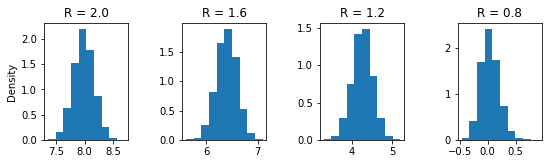

In [7]:
plot_distributions(snapshots1, [2, 1.6, 1.2, 0.8], "R")

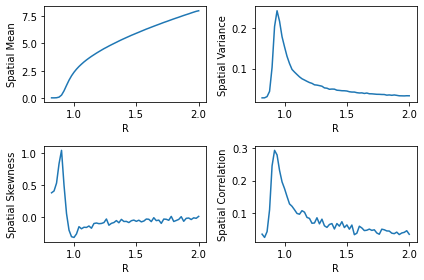

In [8]:
spatial_indicator_grid(snapshots1, "R")

## Observations

Vegetation biomass decreases as rainfall value decreases. This is because lower rainfall leads to reduced water and lower vegetation growth.

Eventually at $R\approx1.0$, vegetation quickly decreases to zero as vegetation growth cannot compensate to losses due to grazing.

As we approach this transition, spatial variance increases and spatial correlation increases due to critical slowing down. Spatial skewness decreases before rapidly increasing.

The system remains in a relatively homogeneous state with no pattern formation. This is due to the similar diffusivities of the biomass and water.

# Local Facilitation Model

## Background

The local facilitation model is a stochastic cellular automaton (Kefi et al. 2007) [[4]](https://doi.org/10.1016/j.tpb.2006.09.003) with discrete time steps.

The ecosystem is represented by a 2D lattice of cells (with periodic boundaries), each of which can be in one of three states: vegetated (+), empty (0) or degraded (-).

Each cell can undergo one of four transformations with a certain probability at each time step:
1. Colonisation: $w_{[0,+]}=[\delta\rho_+ +(1-\delta)q_{+|0}](b-c\rho_+)$

2. Mortality: $w_{[+,0]}=m$

3. Degradation: $w_{[0,-]}=d$

4. Regeneration: $w_{[-,0]}=r+fq_{+|-}$

Colonisation and regeneration probabilities of a cell are positively affected by presence of vegetation in neighbouring cells.

The facilitation leads to the formation of patches of vegetated grid cells; these patches have size distributions that follow a power law.

## Parameters

Model parameters are taken from Dakos et al. (2011) [[3]](https://doi.org/10.1086/659945).

In [9]:
# fixed model parameters
m = 0.1  # mortality probability of a vegetated site
f = 0.9  # local facilitation strength
delta = 0.1  # fraction of seeds globally dispersed
c = 0.3  # germination rate multiplied by global competiive effect
r = 0.0001  # regeneration probaiblity of a degraded site without vegetated neighbours
d = 0.2  # degradation probability of empty sites

# model properties
size = 64  # size of each side of lattice

## Numerical Simulation

We simulate 100 time steps at each parameter level over a range of parameter values from $b=1$ to $b=0$, decreasing $b$ by 0.01 at each iteration. The final values of the simulation at each parameter level are recorded and used as initial values for the next parameter level. The initial simulation will start from the fully vegetated state and have 10 time steps to allow enough time to settle to the equilibrium.

In [10]:
model2 = LocalFacilitationModel(m=m, f=f, delta=delta, c=c, r=r, d=d, size=size)
b = np.arange(1, 0.25, -0.01)

if not load:
    snapshots2 = parameter_change(model2, b, "b", time_steps=100)

## Visualisation

In [11]:
HTML(animate_snapshots(snapshots2, vmin=-1, vmax=1).to_jshtml())

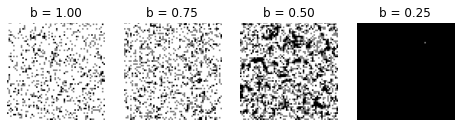

In [12]:
plot_snapshots(snapshots2, [1, 0.75, 0.5, 0.25], "b", vmin=-1, vmax=1, precision=2)

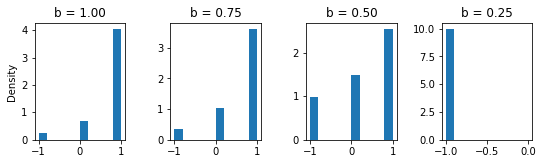

In [13]:
plot_distributions(snapshots2, [1, 0.75, 0.5, 0.25], "b", precision=2)

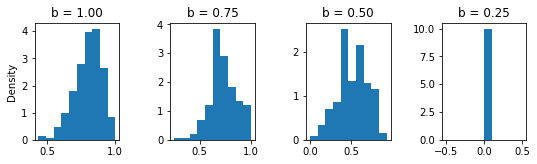

In [14]:
plot_distributions(model2.vegetation_cover(snapshots2), [1, 0.75, 0.5, 0.25], "b", precision=2)

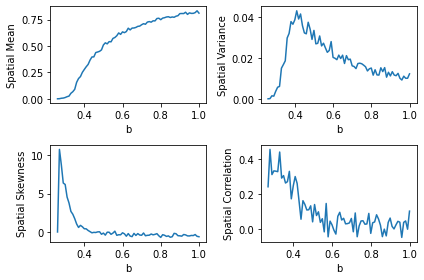

In [15]:
spatial_indicator_grid(model2.vegetation_cover(snapshots2), "b")

Text(0, 0.5, 'Vegetation Patchiness')

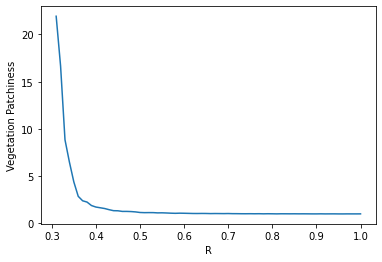

In [16]:
patchiness = model2.vegetation_patchiness(snapshots2)

fig, ax = plt.subplots()
ax.plot(patchiness.loc[patchiness.index > 0.3])
ax.set_xlabel("R")
ax.set_ylabel("Vegetation Patchiness")

## Observations

As the aridity level decreases (environment becomes harsher), vegetation density decreases as colonisation of cells becomes more difficult.

Vegetation go from largely connected across the lattice to being broken down into patches before finally shrinking and disappearing.

As aridity level decreases, spatial variance, spatial skewness and spatial correlation initially all increase. However, spatial variance begins decreasing at b ~ 0.4 and spatial correlation begins decreasing at $b\approx0.25$.

# Scale-dependent Feedback Model

## Background

The scale-dependent feedback model is a system of stochastic partial differential equations describing the dynamics of vegetation biomass $P$, soil water $W$ and surface water $O$ 
(Rietkerk et al. 2002) [[5]](https://doi.org/10.1086/342078).

$\frac{\partial O}{\partial t}=R(t)-\alpha O\frac{P+W_0 k_2}{P+k_2}+D_O\nabla^2O+\sigma dW$

$\frac{\partial W}{\partial t}=\alpha O\frac{P+W_0 k_2}{P+k_2}-g_{max}\frac{W}{W+k_1}P-r_W W+D_W\nabla^2W+\sigma dW$

$\frac{\partial P}{\partial t}=\left(cg_{max}\frac{W}{W+k_1}-d\right)P+D_P\nabla^2P+\sigma dW$


Plants grow depending on soil water availability and lost from mortality or grazing. Surface water is supplied by rainfall and lost due to soil infiltration and runoff. Soil water due to soil infiltration is taken up by plants or lost by runoff.

Plants, soil water and surface water all diffuse in 2D space.

The infiltration rate of water in the soil is higher in areas with vegetation, leading to accumulation of water under 
vegetation and to its depletion further away (scale-dependent feedback).

At the Turing instability, the scale-dependent feedback leads to the formation of regular vegetation patterns.

## Parameters

Model parameters are taken from Dakos et al. (2011) [[3]](https://doi.org/10.1086/659945).

In [17]:
# fixed model properties
c = 10.  # conversion factor for water uptake to plant biomass
gmax = 0.05  # maximum specific water uptake
k1 = 5.  # half saturation constant of water uptake by plants
d = 0.25  # specific rate of plant density loss due to mortality
alpha = 0.2  # rate of surface water infiltration
k2 = 5.  # plant density scale determining how surface water infiltration increases with P
W0 = 0.2  # minimum surface water infiltration coefficient in absence of plants
rW = 0.2  # soil water loss rate due to evaporation and drainage
DP = 0.1  # plant dispersal diffusion constant
DW = 0.1  # soil water diffusion constant
DO = 100  # surface water diffusion constant

# noise
sigma = 0.01  # standard deviation of white noise
noise = "additive"  # type of noise

# model properties
size = 50  # size of each side of lattice

# simulation
dt = 0.1  # time step size
dx = 5  # spatial step size

## Numerical Simulation

Space is discretised ($\Delta x=5$) into a 2D lattice of coupled cells with periodic boundaries.

We approximate the Laplace operator by using the 5-point stencil for $P$ and $W$ and the 9-point stencil for $O$:

$\nabla^2 P_{i,j}=\frac{1}{\Delta x^2}(P_{i+1,j}+P_{i-1,j}+P_{i,j+1}+P_{i,j-1}-4P_{i,j})$

$\nabla^2 W_{i,j}=\frac{1}{\Delta x^2}(W_{i+1,j}+W_{i-1,j}+W_{i,j+1}+W_{i,j-1}-4W_{i,j})$

$\nabla^2 O_{i,j}=\frac{1}{\Delta x^2}[0.5(O_{i+1,j}+O_{i-1,j}+O_{i,j+1}+O_{i,j-1})+0.25(O_{i+1,j+1}+O_{i-1,j+1}+O_{i-1,j+1}+O_{i-1,j-1})-3O_{i,j}]$

The 5-point stencil considers only the four closest adjacent neighbours and is stable for smooth fields. However, the more isotropic and stable 9-point stencil, which also takes into account diagonal neighbours, is required for the fast dynamics of $O$. The condition for numerical stability for the 9-point stencil is $\Delta t<\frac{\Delta x^2}{2D_O}$ [[6]](https://doi.org/10.1002/9783527631520).

We use the Euler-Maruyama method to obtain an approximate numerical solution by discretising time:

$O_{i,j}^{n+1}=O_{i,j}^n+\left(-\alpha O_{i,j}^n\frac{P_{i,j}^n+W_0 k_2}{P_{i,j}^n+k_2}+D_O\nabla^2O_{i,j}^n\right)\Delta t+\sigma\Delta W_{i,j}^n$

$W_{i,j}^{n+1}=W_{i,j}^n+\left(\alpha O_{i,j}^n\frac{P_{i,j}^n+W_0 k_2}{P_{i,j}^n+k_2}-g_{max}\frac{W_{i,j}^n}{W_{i,j}^n+k_1}P_{i,j}^n-r_W W_{i,j}^n+D_W\nabla^2W_{i,j}^n\right)\Delta t+\sigma\Delta W_{i,j}^n$

$P_{i,j}^{n+1}=P_{i,j}^n+\left(\left(cg_{max}\frac{W_{i,j}^n}{W_{i,j}^n+k_1}-d\right)P_{i,j}^n+D_P\nabla^2P_{i,j}^n\right)\Delta t+\sigma\Delta W_{i,j}^n$

where $W_{i,j}^n\sim N(0,\Delta t)$.

We simulate 1000 time steps ($\Delta t=0.1$) at each parameter level over a range of parameter values from $R=1.5$ to $R=0.1$, decreasing $R$ by 0.01 at each iteration. The final values of the simulation at each parameter level are recorded and used as initial values for the next parameter level. The initial simulation will start from the spatially homogeneous equilibrium.

In [18]:
model3 = ScaleDependentFeedbackModel(c=c, gmax=gmax, k1=k1, d=d, alpha=alpha, k2=k2, W0=W0, rW=rW, DP=DP, DW=DW, DO=DO, sigma=sigma, size=size, dt=dt, dx=dx, noise=noise)
R = np.arange(1.5, 0.1, -0.01)

if not load:
    snapshots3 = parameter_change(model3, R, "R", time_steps=1000)

## Visualisation

In [19]:
HTML(animate_snapshots(snapshots3, vmin=0, vmax=20).to_jshtml())

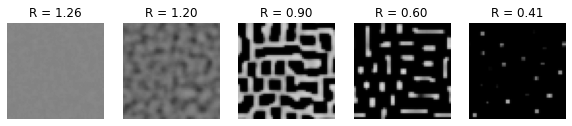

In [20]:
plot_snapshots(snapshots3, [1.26, 1.2, 0.9, 0.6, 0.41], "R", vmin=0, vmax=20, precision=2)

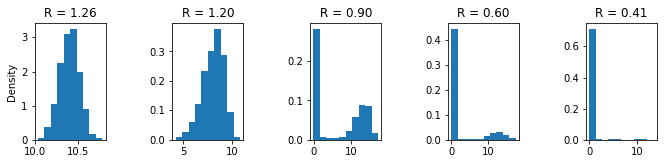

In [21]:
plot_distributions(snapshots3, [1.26, 1.2, 0.9, 0.6, 0.41], "R", precision=2)

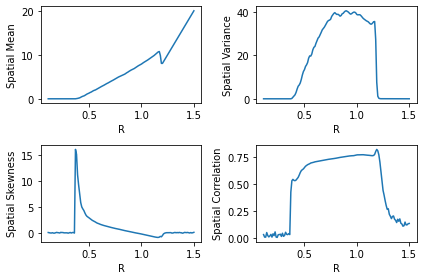

In [22]:
spatial_indicator_grid(snapshots3, "R")

## Observations

As rainfall value decreases, plant density decreases due to reduced plant growth from lower water levels.

Initially, the system remains at spatially homogeneous. However, at $R\approx1.2$, pattern formation starts to occur. Spatial mean jumps up due to increased efficiency of patterns. Spatial variance and spatial correlation greatly increase due to high regularity of patterns. Spatial skewness decreases. At the Turing instability point, scale-dependent feedback is just strong enough to induce patterns.

Subsequently, plant density decreases at a lower rate. Patterns go from gaps to labyrinths to spots. Spatial variance decreases, spatial correlation slowly decreases and spatial skewness increases.

Near the collapsing point at $R\approx0.4$ when plant density goes to zero, spatial variance also goes to zero, spatial correlation sharply drops to zero and spatial skewness sharply increases before dropping to zero. This is due to patterns breaking down and dying away.

## Issues

The simulation initially didn't produce any patterns. So I tried implementing the Turing model (below), which has 2 variables instead of 3 variables, to see if there was a problem with my numerical method. The Turing model managed to produce spots.

I found that unless the time step was extremely small, then the numerical scheme was likely to get unstable. However, an extremely small time step meant that insufficient time steps were simulated without the simulation taking too long.

As the paper mentioned a semi-implicit method, I tried implementing a semi-implicit method instead of an explicit method. However, I found it too complicated and time-consuming to solve multiple equations in a grid, so I opted to stick to the explicit method.

I found that the numerical instability is due to diffusion; in particular, surface water level $O$ which has high diffusion. I tried increasing the spatial step size as the spatial scale of the model was relatively large. However, the time step still needed to be very small.

I looked into the Laplace operator and found that the current 5-point stencil I was using was only stable for smoothly varying fields, which surface water is not. Thus, I used the more isotropic and stable 9-point stencil for the surface water instead. This allowed me to greatly increase the time step so that I could simulate a long enough time for pattern formation to occur.

# Turing Model

## Background

The Turing model is a system of stochastic version of the partial differential equation system with two species, the activator $u$ and the inhibitor $v$ (Borgogno et al. 2009) [[7]](https://doi.org/10.1029/2007RG000256).

$\frac{\partial u}{\partial t}=u(avu-e)+\nabla^2u+\sigma dW$

$\frac{\partial v}{\partial t}=v(b-cu^2v)+d\nabla^2v+\sigma dW$

The growth rate of species $u$ increases with increasing values of $u$ and $v$.

The species $u$ has a strong negative influence (inhibition) on the growth rate of $v$.

## Parameters

Model parameters are taken from Borgogno et al. (2009) [[7]](https://doi.org/10.1029/2007RG000256), but the parameter $b$ is made varying from 100 to 25, where it was originally at 84 in the text. The model parameters taken from the text are at the Turing instability point.

In [23]:
# fixed model parameters
a = 22
c = 113.33
d = 27.2
e = 18

# noise
sigma = 0.1
noise = "additive"

# model properites
size = 50

# simulation
dt = 0.001
dx = 0.25

## Numerical Simulation

Space is discretised ($\Delta x=0.25$) into a 2D lattice of coupled cells with periodic boundaries.

We approximate the Laplace operator by using the 5-point stencil for $u$ and the 9-point stencil for $v$:

$\nabla^2 u_{i,j}=\frac{1}{\Delta x^2}(u_{i+1,j}+u_{i-1,j}+u_{i,j+1}+u_{i,j-1}-4u_{i,j})$

$\nabla^2 v_{i,j}=\frac{1}{\Delta x^2}[0.5(v_{i+1,j}+v_{i-1,j}+v_{i,j+1}+v_{i,j-1})+0.25(v_{i+1,j+1}+v_{i-1,j+1}+v_{i-1,j+1}+v_{i-1,j-1})-3v_{i,j}]$

The more isotropic 9-point stencil is more stable for the fast dynamics of `v`. The condition for numerical stability is $\Delta t<\frac{\Delta x^2}{2d}$.

We use the Euler-Maruyama method to obtain an approximate numerical solution by discretising time:

$u_{i,j}^{n+1}=u_{i,j}^n+(u_{i,j}^n(av_{i,j}^n u_{i,j}^n-e)+\nabla^2u_{i,j})\Delta t+\sigma\Delta W_{i,j}^n$

$v_{i,j}^{n+1}=v_{i,j}^n+(v_{i,j}^n(b-c(u_{i,j}^n)^2v_{i,j}^n)+d\nabla^2v_{i,j}^n)\Delta t+\sigma\Delta W_{i,j}^n$

where $W_{i,j}^n\sim N(0,\Delta t)$.

We simulate 1000 time steps ($\Delta t=0.001$) at each parameter level over a range of parameter values from $b=100$ to $b=25$, decreasing $b$ by 1 at each iteration. The final values of the simulation at each parameter level are recorded and used as initial values for the next parameter level. The initial simulation will start from the spatially homogeneous equilibrium.

In [24]:
model4 = TuringModel(a=a, c=c, d=d, e=e, sigma=sigma, size=size, dt=dt, dx=dx, noise=noise)
b = np.arange(100, 25, -1)

if not load:
    snapshots4 = parameter_change(model4, b, "b", time_steps=1000)

## Visualisation

In [25]:
HTML(animate_snapshots(snapshots4, vmin=0, vmax=1).to_jshtml())

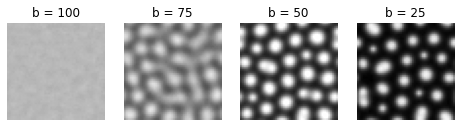

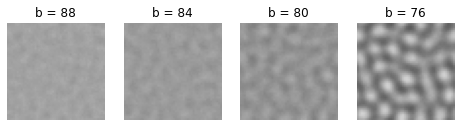

In [26]:
plot_snapshots(snapshots4, [100, 75, 50, 25], "b", vmin=0, vmax=1.5, precision=0)
plot_snapshots(snapshots4, [88, 84, 80, 76], "b", vmin=0, vmax=1.5, precision=0)

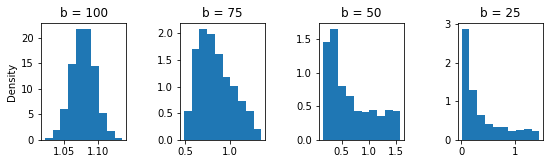

In [27]:
plot_distributions(snapshots4, [100, 75, 50, 25], "b", precision=0)

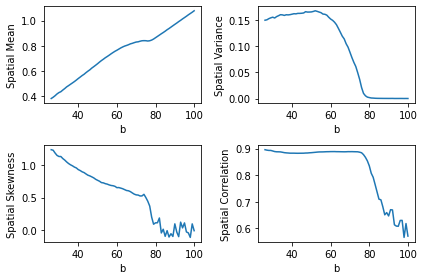

In [28]:
spatial_indicator_grid(snapshots4, "b")

## Observations

As $b$ decreases, $u$ decreases due to increased amounts of the inhibitor $v$.

Initially, the system remains spatially homogeneous. However, at b ~ 80, spots start to form in an arrangement. The organization of spots slows down the decrease of $u$. Before this point spatial variance was zero but spatial correlation was increasing. At this point, spatial variance increases, and spatial correlation is high. Spatial skewness also jumps up and continues increasing.

# Save Simulation Snapshots

In [29]:
save = False  # set to True to save current simulation results

if save:
    data = (snapshots1, snapshots2, snapshots3, snapshots4)
    save_data('Results/spatial_simulation.dat', data)

# References

[[1]](https://doi.org/10.1103/PhysRevLett.90.038101) Shnerb NM, Sarah P, Lavee H, Solomon S (2003) Reactive glass and vegetation patterns. Physical Review Letters 90: 038101.

[[2]](https://doi.org/10.1016/j.ecolmodel.2006.10.005) Guttal V, Jayaprakash C (2007) Impact of noise on bistable ecological systems. Ecological Modelling 201: 420-428.

[[3]](https://doi.org/10.1086/659945) Dakos, V., Kéfi, S., Rietkerk, M., van Nes, E. H., & Scheffer, M. (2011). Slowing down in spatially patterned ecosystems at the brink of collapse. The American Naturalist, 177(6). doi:10.1086/659945

[[4]](https://doi.org/10.1016/j.tpb.2006.09.003) Kefi S, Rietkerk M, van Baalen M, Loreau M (2007) Local facilitation, bistability and transitions in arid ecosystems. Theoretical Population Biology 71: 367–379.

[[5]](https://doi.org/10.1086/342078) Rietkerk M, Boerlijst MC, van Langevelde F, HilleRisLambers R, van de Koppel J, et al. (2002) Self-organization of vegetation in arid ecosystems. American Naturalist 160: 524-530.

[[6]](https://doi.org/10.1002/9783527631520) Provatas, Nikolas; Elder, Ken (2010-10-13). Phase-Field Methods in Materials Science and Engineering. Weinheim, Germany: Wiley-VCH Verlag GmbH & Co. KGaA. p. 219. doi:10.1002/9783527631520. ISBN 978-3-527-63152-0.

[[7]](https://doi.org/10.1029/2007RG000256) Borgogno, F., P. D’Odorico, F. Laio, and L. Ridolfi (2009), Mathematical models of vegetation pattern formation in ecohydrology, Rev. Geophys., 47, RG1005, doi:10.1029/2007RG000256.